In [1]:
import json
import random
from functools import partial

import ase
from ase import build, visualize, io
import e3nn.io
from e3nn import o3, io
from e3nn_invstutorial import radial_spherical_tensor, orthonormal_radial_basis
import ipywidgets
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas
from plotly import subplots
import plotly.graph_objects as go
import plotly.express as px
from scipy.spatial.transform import Rotation
import sympy
import torch

import utils

torch.set_default_dtype(torch.float32)
np.set_printoptions(precision=2)

In [2]:
# Some common functions I want to use

def show_array(positions, calc=None):
    if calc is None:
        calc = lambda x: x
    
    fig = px.imshow(calc(positions), color_continuous_scale='RdBu', zmin=-5, zmax=5)
    widget = go.FigureWidget(fig)

    @ipywidgets.interact(
        xrot=(0, 360, 1.),
        xtrans=(-10, 10, 1.),
        swap=(0, len(positions) - 1, 1)
    )
    def update(xrot=0, xtrans=0, swap=0):
        with widget.batch_update():
            pos = positions.copy()
            
            # Permute
            if swap:
                pos[[swap, 0]] = pos[[0, swap]]
                
            # Translate
            if xtrans:
                pos[:, 0] += xtrans
            
            # Rotate
            if xrot:
                rot = Rotation.from_euler('x', [xrot], degrees=True)
                pos = rot.apply(pos)
            
            print(pos)
            data = calc(pos).T
            widget.data[0].z = data

    return widget

In [3]:
axis = dict(
    showbackground=False,
    showticklabels=False,
    showgrid=False,
    zeroline=False,
    title='',
    nticks=3,
)

layout = dict(
    width=690,
    height=160,
    scene=dict(
        xaxis=dict(
            **axis,
            range=[-8, 8]
        ),
        yaxis=dict(
            **axis,
            range=[-2, 2]
        ),
        zaxis=dict(
            **axis,
            range=[-2, 2]
        ),
        aspectmode='manual',
        aspectratio=dict(x=8, y=2, z=2),
        camera=dict(
            up=dict(x=0, y=0, z=1),
            center=dict(x=0, y=0, z=0),
            eye=dict(x=0, y=-5, z=5),
            projection=dict(type='orthographic'),
        ),
    ),
    paper_bgcolor="rgba(0,0,0,0)",
    plot_bgcolor="rgba(0,0,0,0)",
    margin=dict(l=0, r=0, t=0, b=0)
)

# cmap_bwr = [[0, 'rgb(0,50,255)'], [0.5, 'rgb(200,200,200)'], [1, 'rgb(255,50,0)']]

def s2_grid():
    betas = torch.linspace(0, math.pi, 40)
    alphas = torch.linspace(0, 2 * math.pi, 80)
    beta, alpha = torch.meshgrid(betas, alphas)
    return o3.angles_to_xyz(alpha, beta)

def trace(r, f, c, radial_abs=True):
    if radial_abs:
        a = f.abs()
    else:
        a = 1
    return dict(
        x=a * r[..., 0] + c[0],
        y=a * r[..., 1] + c[1],
        z=a * r[..., 2] + c[2],
        surfacecolor=f
    )

def plot(data, radial_abs=True):
    r = s2_grid()
    n = data.shape[-1]
    traces = [
        trace(r, data[..., i], torch.tensor([2.0 * i - (n - 1.0), 0.0, 0.0]), radial_abs=radial_abs)
        for i in range(n)
    ]
    cmax = max(d['surfacecolor'].abs().max().item() for d in traces)
    traces = [go.Surface(**d, colorscale='RdBu', cmin=-cmax, cmax=cmax) for d in traces]
    fig = go.Figure(data=traces, layout=layout)
    fig.show()
    
def plot_sphere(r):
    fig = go.Figure(
        data=[
            go.Scatter3d(
                x=r[..., 0].flatten(),
                y=r[..., 1].flatten(),
                z=r[..., 2].flatten(),
                mode='markers',
                marker=dict(
                    size=1,
                ),
            )
        ],
        layout=dict(
            width=500,
            height=300,
            scene=dict(
                xaxis=dict(
                    **axis,
                    range=[-1, 1]
                ),
                yaxis=dict(
                    **axis,
                    range=[-1, 1]
                ),
                zaxis=dict(
                    **axis,
                    range=[-1, 1]
                ),
                aspectmode='manual',
                aspectratio=dict(x=3, y=3, z=3),
                camera=dict(
                    up=dict(x=0, y=0, z=1),
                    center=dict(x=0, y=0, z=0),
                    eye=dict(x=0, y=-5, z=5),
                    projection=dict(type='orthographic'),
                ),
            ),
            paper_bgcolor="rgba(0,0,0,0)",
            plot_bgcolor="rgba(0,0,0,0)",
            margin=dict(l=0, r=0, t=0, b=0)
        )
    )
    fig.show()

    
def random_point_signal(lmax, N=5, r_min=1e-1, std=1.):
    n = N
    points = torch.randn(n, 3) * std / np.sqrt(3.)
    points /= points.norm(2, -1, keepdim=True)
#     select = (points.norm(2, -1) > r_min).nonzero()
    return io.SphericalTensor(lmax, p_val=1, p_arg=-1).from_geometry_adjusted(points)

# Analysing Geometry and Structure of Atomic Configurations with Equivariant and Invariant Functions 

Martin Uhrin and Thomas Hardin - November, 29$^\text{th}$, 2021

<img src="img/invariants-generation.png"/>

# Motivation

<img src="img/energy-regression.png"/>

Properties we would like $\Phi$ to have:
* Permutational invariance
* Translational invariance
* Rotational invariance
* Smoothness
* Completeness

In [32]:
molecule = build.molecule('CH3COCH3')
utils.view(molecule)

In [25]:
show_array(molecule.positions)

interactive(children=(FloatSlider(value=0.0, description='xrot', max=360.0, step=1.0), FloatSlider(value=0.0, …

FigureWidget({
    'data': [{'coloraxis': 'coloraxis',
              'hovertemplate': 'x: %{x}<br>y: %{y}<br>c…

### 1. Permutation

In [26]:
def sum_coords(pos):
    # Sum the coordinates along x, y and z
    return pos.sum(axis=0).reshape(3, 1)

show_array(molecule.positions, sum_coords)

interactive(children=(FloatSlider(value=0.0, description='xrot', max=360.0, step=1.0), FloatSlider(value=0.0, …

FigureWidget({
    'data': [{'coloraxis': 'coloraxis',
              'hovertemplate': 'x: %{x}<br>y: %{y}<br>c…

### 2. Translation

In [27]:
def center(pos):
    # Subtract centre of mass
    return (pos - pos.sum(axis=0) / len(pos))

show_array(molecule.positions, center)

interactive(children=(FloatSlider(value=0.0, description='xrot', max=360.0, step=1.0), FloatSlider(value=0.0, …

FigureWidget({
    'data': [{'coloraxis': 'coloraxis',
              'hovertemplate': 'x: %{x}<br>y: %{y}<br>c…

### 3. Rotation

In [28]:
def norms(pos):
    # Get norms of pos vectors
    return (pos**2).sum(axis=1).reshape(-1, 1)

show_array(molecule.positions, norms)

interactive(children=(FloatSlider(value=0.0, description='xrot', max=360.0, step=1.0), FloatSlider(value=0.0, …

FigureWidget({
    'data': [{'coloraxis': 'coloraxis',
              'hovertemplate': 'x: %{x}<br>y: %{y}<br>c…

Putting it all together

In [29]:
def invariance(pos):
    trans = center(pos)
    rots = norms(trans)
    return rots.sum().reshape(-1, 1)

show_array(molecule.positions, invariance)

interactive(children=(FloatSlider(value=0.0, description='xrot', max=360.0, step=1.0), FloatSlider(value=0.0, …

FigureWidget({
    'data': [{'coloraxis': 'coloraxis',
              'hovertemplate': 'x: %{x}<br>y: %{y}<br>c…

## Expanding a density in a spherical harmonic basis

The spherical harmonics are a basis for functions defined on the sphere.
For a given function on the sphere, $f$, we can find the expansions coefficients from

$c_{l}^m = \int_0^{2\pi} \int_0^\pi Y_l^m (\theta, \varphi) f(\theta, \varphi) \sin{\theta} d\theta d\varphi \text{,}$

and thanks to the orthonormality of spherical harmonics we can reconstruct (an approximation to) the function using

$\tilde{f}(\theta, \phi) = \sum_l \sum_{m = -l}^l c_{nl}^m Y_l^m(\theta, \phi)$

In [32]:
# Create a grid of points on the sphere
r = s2_grid()
plot_sphere(r)

In [12]:
# Plot x, y, z componenets separately
plot(r, radial_abs=False)

We can deform the spheres into a shape that has its radius equal to the absolute value of the plotted quantity:

In [13]:
plot(r)

These are the $l = 1$ spherical harmonics ($Y^1$).  Now, let's compute $Y^2$.

In [14]:
tp = o3.ElementwiseTensorProduct("1o", "1o", ['2e'], irrep_normalization='norm')
y2 = tp(r, r)
plot(y2)

And finally, let's do $Y^3$

In [15]:
tp = o3.ElementwiseTensorProduct("2e", "1o", ['3o'], irrep_normalization='norm')
y3 = tp(y2, r)
plot(y3)

So, let's expand our molecule in this basis

In [34]:
def calc_tensor(pos, values):
    sph_tensor = io.SphericalTensor(lmax=4, p_val=1, p_arg=-1).sum_of_diracs(
        torch.tensor(pos), torch.tensor(values))
    return sph_tensor.reshape(-1, 5)

show_array(molecule.positions, lambda pos: calc_tensor(pos, molecule.numbers))

interactive(children=(FloatSlider(value=0.0, description='xrot', max=360.0, step=1.0), FloatSlider(value=0.0, …

FigureWidget({
    'data': [{'coloraxis': 'coloraxis',
              'hovertemplate': 'x: %{x}<br>y: %{y}<br>c…

OK, but how to I get rotation invariants from this?

Let's look at the way our spherical tensor transforms as we form rotations:

In [37]:
def calc_rot_mtx(pos):
    pos = torch.tensor(pos, dtype=torch.get_default_dtype())
    x = torch.tensor([1., 0, 0]); y = torch.tensor([0, 1., 0]);  z = torch.tensor([0., 0, 1.])
    irreps = e3nn.io.SphericalTensor(5, 1, -1)
    # Calculate Wigner-D from Euler angles
    D = irreps.D_from_angles(torch.dot(pos[0], x), torch.dot(pos[0], y), torch.dot(pos[0], z))
    return 2 * D.detach().numpy()
    
show_array(molecule.positions, calc_rot_mtx)

interactive(children=(FloatSlider(value=0.0, description='xrot', max=360.0, step=1.0), FloatSlider(value=0.0, …

FigureWidget({
    'data': [{'coloraxis': 'coloraxis',
              'hovertemplate': 'x: %{x}<br>y: %{y}<br>c…

#### Invariants from tensor products of irreducible representations

So we have found _one_ of our rotation invariants, but clearly this is an incomplete description of our function.

No problem - we can generate more invariants!


##### Degree-1 invariants

$c_{0}^0$ are invariants corresponding to $\mathbf{D}^0$.

#### Degree-2 invariants (power spectrum)

Invariants from a single tensor product $(\mathbf{D}^{l} \otimes \mathbf{D}^{l})^0$.

#### Degree-3 invariants (bispectrum)

Invariants from two tensor products $((\mathbf{D}^{l_1} \otimes \mathbf{D}^{l_2})^l \otimes \mathbf{D}^l)^0$.

#### Degree-4 invariants (trispectrum)

Invariants from three tensor products $((\mathbf{D}^{l_1} \otimes \mathbf{D}^{l_2})^l \otimes (\mathbf{D}^{l_3} \otimes \mathbf{D}^{l_4})^l)^0$

One can continue this up to arbitrary degree but, thus far, degree-4 has always been found to be sufficient to distinguish atomic configurations.

Let's use e3nn to calculate the bispectrum.

In [39]:
lmax = 4
bispectrum_main = o3.ReducedTensorProducts(
    'ijk=jik=ikj', i=o3.Irreps.spherical_harmonics(lmax), 
    filter_ir_mid=list(o3.Irrep.iterator(lmax)), filter_ir_out=list(o3.Irrep.iterator(lmax=0)))
print(bispectrum_main.irreps_out)
bispectrum = lambda x : bispectrum_main(x, x, x)

1x0o+14x0e


In [40]:
def calc_tensor(pos, values):
    sph_tensor = io.SphericalTensor(lmax=lmax, p_val=1, p_arg=-1).sum_of_diracs(
        torch.tensor(pos, dtype=torch.get_default_dtype()), torch.tensor(values, dtype=torch.get_default_dtype()))
    return bispectrum(sph_tensor).reshape(-1, 1)

show_array(molecule.positions, lambda pos: calc_tensor(pos, molecule.numbers))

interactive(children=(FloatSlider(value=0.0, description='xrot', max=360.0, step=1.0), FloatSlider(value=0.0, …

FigureWidget({
    'data': [{'coloraxis': 'coloraxis',
              'hovertemplate': 'x: %{x}<br>y: %{y}<br>c…

## What do the invariants tell us?

In [41]:
tetra = np.array([
    [0., 0., 0.],
    [1., 0., 1.],
    [0., 1., 1.],
    [1., 1., 0.]
])
tetra = tetra - tetra.mean(0, keepdims=True)
tetra /= np.linalg.norm(tetra, keepdims=True, axis=-1)
utils.view(ase.Atoms(positions=tetra))

In [42]:
def tetra_to_seesaw(t):
    upper_scale = (1 - t) / 1
    lower_scale = 1 / (1 - t)
    return np.array([
        [-0.57735027 * lower_scale, -0.57735027 * lower_scale, -0.57735027],
        [ 0.57735027 * lower_scale,  0.57735027 * lower_scale, -0.57735027],
        [ 0.57735027 * upper_scale, -0.57735027 * upper_scale,  0.57735027],
        [-0.57735027 * upper_scale,  0.57735027 * upper_scale,  0.57735027],])

seesaw = tetra_to_seesaw(0.5)
utils.view(ase.Atoms(positions=seesaw))

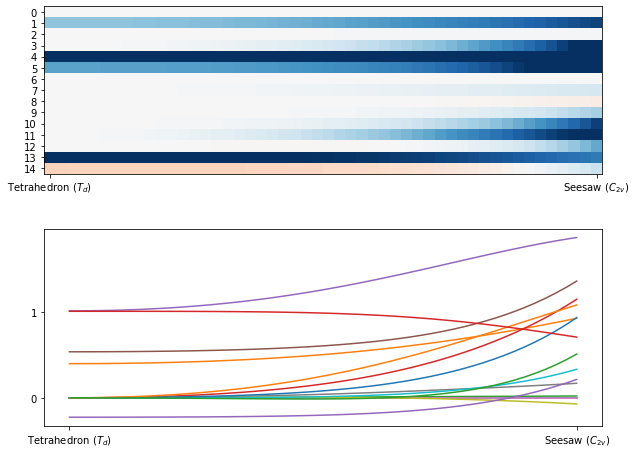

In [45]:
scale = 1.5
tetra_seesaw = [tetra_to_seesaw(i) * scale  for i in np.linspace(0, 0.5, 50)]

bis = []

for shape in tetra_seesaw:
    bis.append(
        bispectrum(
            io.SphericalTensor(lmax, p_val=1, p_arg=-1).with_peaks_at(
                torch.from_numpy(shape)).to(dtype=torch.get_default_dtype())
        )
    )

bis = torch.stack(bis, dim=0)

fig, ax = plt.subplots(2, 1, figsize=(10, 8))
plt.sca(ax[0])
plt.yticks(list(range(15)))
plt.xticks([0, 49], ['Tetrahedron ($T_d$)', 'Seesaw ($C_{2v}$)'])
plt.imshow(bis.T, cmap='RdBu', vmin=-1, vmax=1)
plt.sca(ax[1])
plt.yticks(list(range(15)))
plt.xticks([0, 49], ['Tetrahedron ($T_d$)', 'Seesaw ($C_{2v}$)'])
plt.plot(bis);